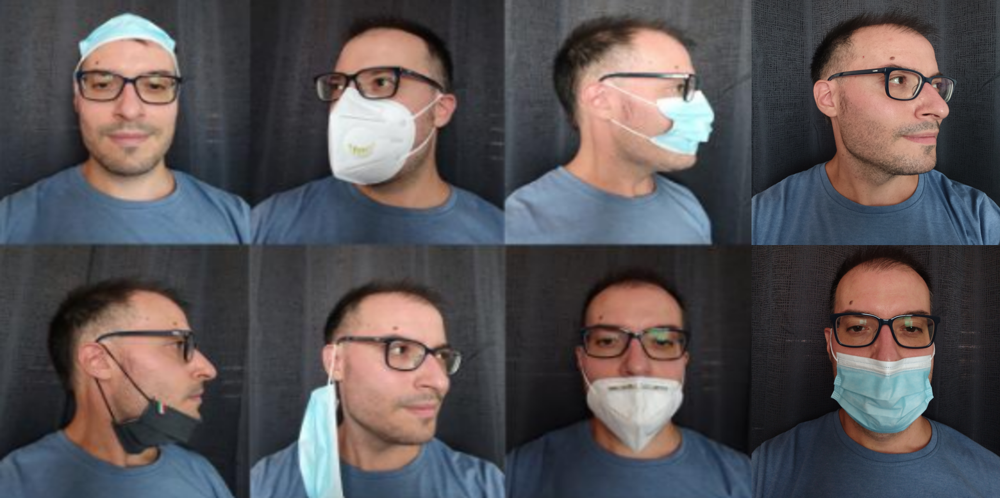

#### The dataset can be downloaded from:
https://ieee-dataport.org/open-access/ways-wear-mask-or-respirator-wwmr-db![image.png](attachment:image.png)

In [1]:
import pandas as pd 
import numpy as np 
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor, Lambda
from torchvision import transforms, models
import os 
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from torchsummary import summary
from torch import nn
from torchvision.transforms.functional import crop
import cv2
import time
import copy
import torchvision
from torchvision import models
import torch.optim as optim
from torch.optim import lr_scheduler
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import torchnet.meter.confusionmeter as cm
import seaborn as sn

In [2]:
# Apply RandomSampler to DataLoader to tackle the class imbalance issue
from torch.utils.data import WeightedRandomSampler

data_dir = './data_/'
input_size = (3,256,185)
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((256,185)), 
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(),
        transforms.RandomRotation(10),
        transforms.ToTensor(),
    ]),
    'val': transforms.Compose([
        transforms.Resize((256,185)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(),
        transforms.RandomRotation(10),
        transforms.ToTensor(),
    ]),
    'test': transforms.Compose([
        transforms.Resize((256,185)),
        transforms.ToTensor(),
    ])
}


class_weights=[2, 3, 1, 2, 2, 2, 2, 3]
train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'),
                                          data_transforms['train'])

val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'),
                                          data_transforms['val'])

test_dataset = datasets.ImageFolder(os.path.join(data_dir, 'test'),
                                          data_transforms['test'])

train_sample_weights = [0] * len(train_dataset)

for idx, (data,label) in enumerate(train_dataset):
    class_weight =class_weights[label]
    train_sample_weights[idx]=class_weight

val_sample_weights = [0] * len(val_dataset)

for idx, (data,label) in enumerate(val_dataset):
    class_weight =class_weights[label]
    val_sample_weights[idx]=class_weight


sample_weights={'train':train_sample_weights, 'val':val_sample_weights}

image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                         data_transforms[x])
                 for x in ['train', 'val', 'test']}

sampler = {x: WeightedRandomSampler(sample_weights[x], num_samples=len(sample_weights[x]), replacement=True) for x in ['train', 'val']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, sampler=sampler[x],
                                             shuffle=False, num_workers=4)
              for x in ['train', 'val']}

dataloader_test = torch.utils.data.DataLoader(image_datasets['test'], batch_size=4,
                                             shuffle=False, num_workers=4)

dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}



for x in ['train', 'val', 'test']:
    print("Loaded {} images under {}".format(dataset_sizes[x], x))

class_names = image_datasets['train'].classes
print(class_names)

Loaded 643 images under train
Loaded 210 images under val
Loaded 204 images under test
['0MaskCorrectlyWorn', '1MaskFoldedAboveChin', '2MaskHangingFromAnEar', '3MaskOnForehead', '4MaskOnTheTipOfNose', '5MaskUnderChin', '6MaskUnderNose', '7MaskNotWorn']


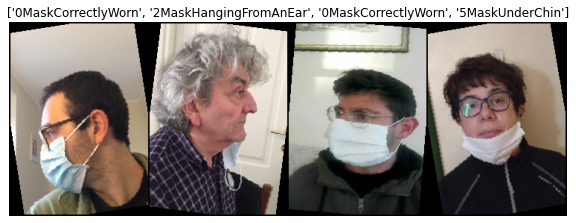

In [3]:
# Get a batch of training data and visualize the images
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def show_databatch(inputs, classes):
    out = torchvision.utils.make_grid(inputs)
    imshow(out, title=[class_names[x] for x in classes])


inputs, classes = next(iter(dataloaders['train']))
show_databatch(inputs, classes)

In [4]:
# Define a function to obtain the model size
def print_size_of_model(model):
    torch.save(model.state_dict(), "temp.p")
    print('Size (MB):', os.path.getsize("temp.p")/1e6)
    os.remove('temp.p')

In [5]:
# Function to train the model
def train_model(model, criterion, optimizer, scheduler, num_epochs):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch +1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            #For graph generation
            if phase == "train":
                train_loss.append(running_loss/dataset_sizes[phase])
                train_acc.append(running_corrects.double() / dataset_sizes[phase])
                epoch_counter_train.append(epoch)
            if phase == "val":
                val_loss.append(running_loss/ dataset_sizes[phase])
                val_acc.append(running_corrects.double() / dataset_sizes[phase])
                epoch_counter_val.append(epoch)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            #for printing        
            if phase == "train":    
                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]
            if phase == "val":    
                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the best model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

For this multi-class classification problem, four different neural networks will be applied ; the model with the best performance will be identified.

### Model 1: MCU Net -256kB

In [43]:
from mcunet.model_zoo import net_id_list, build_model, download_tflite
print(net_id_list) 

['mcunet-10fps', 'mcunet-5fps', 'mcunet-256kB', 'mcunet-320kB', 'mcunet-512kB', 'mbv2-320kB', 'proxyless-320kB', 'mcunet-10fps-vww', 'mcunet-5fps-vww', 'mcunet-320kB-vww', 'person-det']


In [44]:
model1, image_size, description = build_model(net_id="mcunet-256kB", pretrained=True) 

In [45]:
num_ftrs = model1.classifier.linear.in_features
model1.classifier.linear = nn.Linear(num_ftrs, 8)
model1.to(device)

ProxylessNASNets(
  (first_conv): ConvLayer(
    (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): ReLU6(inplace=True)
  )
  (blocks): ModuleList(
    (0): MobileInvertedResidualBlock(
      (mobile_inverted_conv): MBInvertedConvLayer(
        (depth_conv): Sequential(
          (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (act): ReLU6(inplace=True)
        )
        (point_linear): Sequential(
          (conv): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
    )
    (1): MobileInvertedResidualBlock(
      (mobile_inverted_conv): MBInvertedConvLayer(
        (inverted_bot

In [46]:
summary(model1, input_size=input_size )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 16, 128, 93]             432
       BatchNorm2d-2          [-1, 16, 128, 93]              32
             ReLU6-3          [-1, 16, 128, 93]               0
         ConvLayer-4          [-1, 16, 128, 93]               0
            Conv2d-5          [-1, 16, 128, 93]             144
       BatchNorm2d-6          [-1, 16, 128, 93]              32
             ReLU6-7          [-1, 16, 128, 93]               0
            Conv2d-8           [-1, 8, 128, 93]             128
       BatchNorm2d-9           [-1, 8, 128, 93]              16
MBInvertedConvLayer-10           [-1, 8, 128, 93]               0
MobileInvertedResidualBlock-11           [-1, 8, 128, 93]               0
           Conv2d-12          [-1, 24, 128, 93]             192
      BatchNorm2d-13          [-1, 24, 128, 93]              48
            ReLU6-14       

In [47]:
# Loss function
criterion = nn.CrossEntropyLoss()
# Use Adam as the parameter optimizer
optimizer_ft = optim.Adam(model1.parameters(), lr = 0.001, betas=(0.9, 0.999))
# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1) 

# Lists for graph generation
epoch_counter_train = []
epoch_counter_val = []
train_loss = []
val_loss = []
train_acc = []
val_acc = []

In [48]:
model1 = train_model(model1, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=100) 

Epoch 1/100
----------


/extdrv/sdb/miniforge3/envs/pytorch-new/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train Loss: 1.6403 Acc: 0.3919
val Loss: 1.1630 Acc: 0.5810

Epoch 2/100
----------
train Loss: 1.0562 Acc: 0.5956
val Loss: 0.9816 Acc: 0.6000

Epoch 3/100
----------
train Loss: 0.7950 Acc: 0.7170
val Loss: 0.8800 Acc: 0.6857

Epoch 4/100
----------
train Loss: 0.8331 Acc: 0.7123
val Loss: 0.8748 Acc: 0.6714

Epoch 5/100
----------
train Loss: 0.6884 Acc: 0.7496
val Loss: 0.7157 Acc: 0.6952

Epoch 6/100
----------
train Loss: 0.6738 Acc: 0.7527
val Loss: 0.5063 Acc: 0.7714

Epoch 7/100
----------
train Loss: 0.5330 Acc: 0.8072
val Loss: 0.7282 Acc: 0.7000

Epoch 8/100
----------
train Loss: 0.3940 Acc: 0.8631
val Loss: 0.5143 Acc: 0.7952

Epoch 9/100
----------
train Loss: 0.3688 Acc: 0.8694
val Loss: 0.6573 Acc: 0.7667

Epoch 10/100
----------
train Loss: 0.3212 Acc: 0.8818
val Loss: 0.4268 Acc: 0.8429

Epoch 11/100
----------
train Loss: 0.3123 Acc: 0.9067
val Loss: 0.4621 Acc: 0.8286

Epoch 12/100
----------
train Loss: 0.2643 Acc: 0.9067
val Loss: 0.5289 Acc: 0.8571

Epoch 13/100

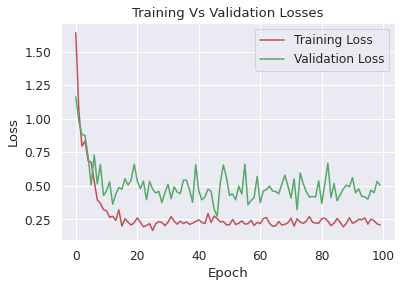

In [49]:
# Plot the train & validation losses
plt.figure(1)
plt.title("Training Vs Validation Losses")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.plot(epoch_counter_train,train_loss,color = 'r', label="Training Loss")
plt.plot(epoch_counter_val,val_loss,color = 'g', label="Validation Loss")
plt.legend()
plt.show()

In [50]:
print_size_of_model(model1)

Size (MB): 2.466293


In [51]:
# Test the accuracy with test data
correct = 0
total = 0
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model1(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the test images: 81 %


In [52]:
# Class wise testing accuracy
class_correct = list(0. for i in range(8))
class_total = list(0. for i in range(8))
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model1(inputs)
            _, predicted = torch.max(outputs, 1)
            point = (predicted == labels).squeeze()
            for j in range(len(labels)):
                label = labels[j]
                class_correct[label] += point[j].item()
                class_total[label] += 1

for i in range(8):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))

Accuracy of 0MaskCorrectlyWorn : 66 %
Accuracy of 1MaskFoldedAboveChin : 84 %
Accuracy of 2MaskHangingFromAnEar : 78 %
Accuracy of 3MaskOnForehead : 96 %
Accuracy of 4MaskOnTheTipOfNose : 75 %
Accuracy of 5MaskUnderChin : 91 %
Accuracy of 6MaskUnderNose : 74 %
Accuracy of 7MaskNotWorn : 90 %


[[16  4  0  0  4  0  0  0]
 [ 3 16  0  0  0  0  0  0]
 [ 0  0 32  1  0  0  0  8]
 [ 0  0  0 24  0  0  0  1]
 [ 0  0  0  0 18  0  6  0]
 [ 0  0  1  0  0 22  0  1]
 [ 0  0  0  0  7  0 20  0]
 [ 0  0  1  1  0  0  0 18]]


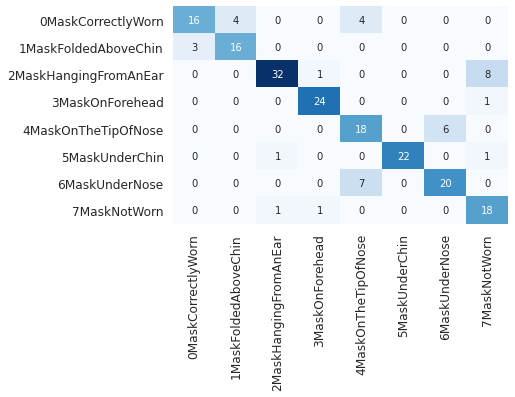

In [53]:
# Get the confusion matrix for test data
confusion_matrix = cm.ConfusionMeter(8)
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model1(inputs)
        _, predicted = torch.max(outputs, 1)
        confusion_matrix.add(predicted, labels)
    print(confusion_matrix.conf)

# Confusion matrix as a heatmap
con_m = confusion_matrix.conf
df_con_m = pd.DataFrame(con_m, index= [i for i in class_names], columns = [i for i in class_names])
sn.set(font_scale= 1.1)
sn.heatmap(df_con_m, annot=True,fmt='g' ,  annot_kws={"size" : 10}, cbar = False, cmap="Blues") 

***

### Model 2: MobileNet

In [15]:
from torchvision.models.mobilenetv2 import mobilenet_v2
mobilenet = mobilenet_v2(pretrained=True)
num_ftrs = mobilenet.classifier[1].in_features
mobilenet.classifier[1] = nn.Linear(num_ftrs, 8)
mobilenet.to(device)

MobileNetV2(
  (features): Sequential(
    (0): ConvNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): ConvNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): ConvNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05,

In [16]:
summary(mobilenet, input_size=input_size )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 32, 128, 93]             864
       BatchNorm2d-2          [-1, 32, 128, 93]              64
             ReLU6-3          [-1, 32, 128, 93]               0
            Conv2d-4          [-1, 32, 128, 93]             288
       BatchNorm2d-5          [-1, 32, 128, 93]              64
             ReLU6-6          [-1, 32, 128, 93]               0
            Conv2d-7          [-1, 16, 128, 93]             512
       BatchNorm2d-8          [-1, 16, 128, 93]              32
  InvertedResidual-9          [-1, 16, 128, 93]               0
           Conv2d-10          [-1, 96, 128, 93]           1,536
      BatchNorm2d-11          [-1, 96, 128, 93]             192
            ReLU6-12          [-1, 96, 128, 93]               0
           Conv2d-13           [-1, 96, 64, 47]             864
      BatchNorm2d-14           [-1, 96,

In [17]:
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.Adam(mobilenet.parameters(), lr = 0.001, betas=(0.9, 0.999))
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1) 

epoch_counter_train = []
epoch_counter_val = []
train_loss = []
val_loss = []
train_acc = []
val_acc = []

In [18]:
mobilenet = train_model(mobilenet, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=100) 

Epoch 1/100
----------


/extdrv/sdb/miniforge3/envs/pytorch-new/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train Loss: 1.9632 Acc: 0.3017
val Loss: 1.8917 Acc: 0.3000

Epoch 2/100
----------
train Loss: 1.6159 Acc: 0.3919
val Loss: 1.2859 Acc: 0.4524

Epoch 3/100
----------
train Loss: 1.3990 Acc: 0.4370
val Loss: 0.9528 Acc: 0.6000

Epoch 4/100
----------
train Loss: 1.2975 Acc: 0.4790
val Loss: 0.9385 Acc: 0.6333

Epoch 5/100
----------
train Loss: 1.1360 Acc: 0.5568
val Loss: 1.1658 Acc: 0.5333

Epoch 6/100
----------
train Loss: 1.0371 Acc: 0.5614
val Loss: 0.8471 Acc: 0.5952

Epoch 7/100
----------
train Loss: 0.8562 Acc: 0.6283
val Loss: 0.6716 Acc: 0.7000

Epoch 8/100
----------
train Loss: 0.7151 Acc: 0.6905
val Loss: 0.6830 Acc: 0.7333

Epoch 9/100
----------
train Loss: 0.6730 Acc: 0.7356
val Loss: 0.5266 Acc: 0.7714

Epoch 10/100
----------
train Loss: 0.5528 Acc: 0.7932
val Loss: 0.5694 Acc: 0.7286

Epoch 11/100
----------
train Loss: 0.5807 Acc: 0.7745
val Loss: 0.4358 Acc: 0.8667

Epoch 12/100
----------
train Loss: 0.5231 Acc: 0.7854
val Loss: 0.4354 Acc: 0.8286

Epoch 13/100

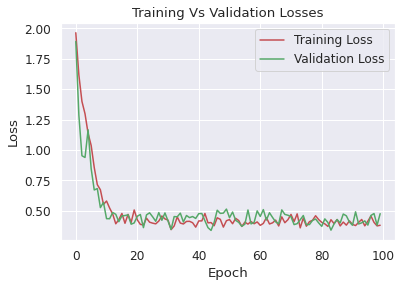

In [19]:
plt.figure(1)
plt.title("Training Vs Validation Losses")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.plot(epoch_counter_train,train_loss,color = 'r', label="Training Loss")
plt.plot(epoch_counter_val,val_loss,color = 'g', label="Validation Loss")
plt.legend()
plt.show()

In [20]:
print_size_of_model(mobilenet)

Size (MB): 9.179981


In [21]:
correct = 0
total = 0
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = mobilenet(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the test images: 77 %


In [22]:
class_correct = list(0. for i in range(8))
class_total = list(0. for i in range(8))
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = mobilenet(inputs)
            _, predicted = torch.max(outputs, 1)
            point = (predicted == labels).squeeze()
            for j in range(len(labels)):
                label = labels[j]
                class_correct[label] += point[j].item()
                class_total[label] += 1

for i in range(8):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))

Accuracy of 0MaskCorrectlyWorn : 75 %
Accuracy of 1MaskFoldedAboveChin : 89 %
Accuracy of 2MaskHangingFromAnEar : 51 %
Accuracy of 3MaskOnForehead : 88 %
Accuracy of 4MaskOnTheTipOfNose : 70 %
Accuracy of 5MaskUnderChin : 95 %
Accuracy of 6MaskUnderNose : 88 %
Accuracy of 7MaskNotWorn : 85 %


[[18  4  0  0  1  0  1  0]
 [ 2 17  0  0  0  0  0  0]
 [ 0  0 21  0  0  1  0 19]
 [ 0  0  0 22  0  0  0  3]
 [ 1  0  0  0 17  0  6  0]
 [ 0  0  0  0  0 23  0  1]
 [ 0  0  0  0  3  0 24  0]
 [ 0  0  2  0  0  1  0 17]]


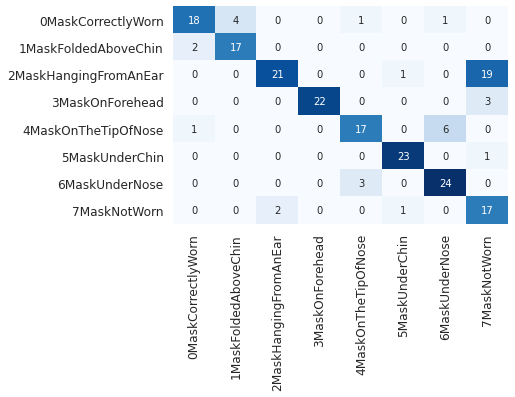

In [23]:
confusion_matrix = cm.ConfusionMeter(8)
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = mobilenet(inputs)
        _, predicted = torch.max(outputs, 1)
        confusion_matrix.add(predicted, labels)
    print(confusion_matrix.conf)

con_m = confusion_matrix.conf
df_con_m = pd.DataFrame(con_m, index= [i for i in class_names], columns = [i for i in class_names])
sn.set(font_scale= 1.1)
sn.heatmap(df_con_m, annot=True,fmt='g' ,  annot_kws={"size" : 10}, cbar = False, cmap="Blues") 

***

### Model 3: Efficient Net - B3

In [24]:
effnet = models.efficientnet_b3(pretrained=True)
num_ftrs = effnet.classifier[1].in_features
effnet.classifier[1] = nn.Linear(num_ftrs, 8)
effnet = effnet.to(device)

In [75]:
effnet

EfficientNet(
  (features): Sequential(
    (0): ConvNormActivation(
      (0): Conv2d(3, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
            (1): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(40, 10, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(10, 40, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): ConvNormActivation(

In [25]:
summary(effnet, input_size=input_size )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 40, 128, 93]           1,080
       BatchNorm2d-2          [-1, 40, 128, 93]              80
              SiLU-3          [-1, 40, 128, 93]               0
            Conv2d-4          [-1, 40, 128, 93]             360
       BatchNorm2d-5          [-1, 40, 128, 93]              80
              SiLU-6          [-1, 40, 128, 93]               0
 AdaptiveAvgPool2d-7             [-1, 40, 1, 1]               0
            Conv2d-8             [-1, 10, 1, 1]             410
              SiLU-9             [-1, 10, 1, 1]               0
           Conv2d-10             [-1, 40, 1, 1]             440
          Sigmoid-11             [-1, 40, 1, 1]               0
SqueezeExcitation-12          [-1, 40, 128, 93]               0
           Conv2d-13          [-1, 24, 128, 93]             960
      BatchNorm2d-14          [-1, 24, 

In [26]:
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.Adam(effnet.parameters(), lr = 0.001, betas=(0.9, 0.999))
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1) 

epoch_counter_train = []
epoch_counter_val = []
train_loss = []
val_loss = []
train_acc = []
val_acc = []

In [27]:
effnet = train_model(effnet, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=100) 

Epoch 1/100
----------


/extdrv/sdb/miniforge3/envs/pytorch-new/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train Loss: 1.6727 Acc: 0.3670
val Loss: 1.2864 Acc: 0.5429

Epoch 2/100
----------
train Loss: 1.2831 Acc: 0.5334
val Loss: 1.0548 Acc: 0.6000

Epoch 3/100
----------
train Loss: 0.8481 Acc: 0.6983
val Loss: 0.9130 Acc: 0.6905

Epoch 4/100
----------
train Loss: 0.7372 Acc: 0.7309
val Loss: 0.9935 Acc: 0.6286

Epoch 5/100
----------
train Loss: 0.6181 Acc: 0.7698
val Loss: 0.7091 Acc: 0.7286

Epoch 6/100
----------
train Loss: 0.5532 Acc: 0.7776
val Loss: 0.7136 Acc: 0.7429

Epoch 7/100
----------
train Loss: 0.3887 Acc: 0.8600
val Loss: 0.5083 Acc: 0.8143

Epoch 8/100
----------
train Loss: 0.3335 Acc: 0.8802
val Loss: 0.5094 Acc: 0.8286

Epoch 9/100
----------
train Loss: 0.2787 Acc: 0.8958
val Loss: 0.4349 Acc: 0.8286

Epoch 10/100
----------
train Loss: 0.2409 Acc: 0.9036
val Loss: 0.2829 Acc: 0.8952

Epoch 11/100
----------
train Loss: 0.1846 Acc: 0.9347
val Loss: 0.3133 Acc: 0.8667

Epoch 12/100
----------
train Loss: 0.1417 Acc: 0.9518
val Loss: 0.3828 Acc: 0.8714

Epoch 13/100

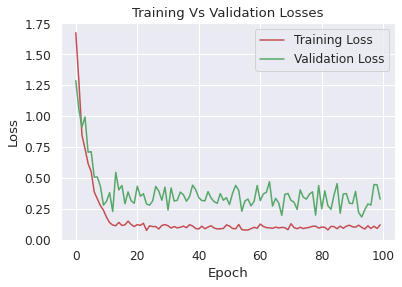

In [28]:
plt.figure(1)
plt.title("Training Vs Validation Losses")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.plot(epoch_counter_train,train_loss,color = 'r', label="Training Loss")
plt.plot(epoch_counter_val,val_loss,color = 'g', label="Validation Loss")
plt.legend()
plt.show()

In [29]:
print_size_of_model(effnet)

Size (MB): 43.388293


In [30]:
correct = 0
total = 0
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = effnet(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the test images: 88 %


In [31]:
class_correct = list(0. for i in range(8))
class_total = list(0. for i in range(8))
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = effnet(inputs)
            _, predicted = torch.max(outputs, 1)
            point = (predicted == labels).squeeze()
            for j in range(len(labels)):
                label = labels[j]
                class_correct[label] += point[j].item()
                class_total[label] += 1

for i in range(8):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))

Accuracy of 0MaskCorrectlyWorn : 75 %
Accuracy of 1MaskFoldedAboveChin : 94 %
Accuracy of 2MaskHangingFromAnEar : 97 %
Accuracy of 3MaskOnForehead : 92 %
Accuracy of 4MaskOnTheTipOfNose : 83 %
Accuracy of 5MaskUnderChin : 87 %
Accuracy of 6MaskUnderNose : 81 %
Accuracy of 7MaskNotWorn : 95 %


[[18  2  0  0  4  0  0  0]
 [ 0 18  0  0  1  0  0  0]
 [ 0  0 40  0  0  0  0  1]
 [ 0  0  0 23  0  0  0  2]
 [ 0  0  0  0 20  0  4  0]
 [ 0  0  2  0  0 21  0  1]
 [ 0  0  0  0  5  0 22  0]
 [ 0  0  1  0  0  0  0 19]]


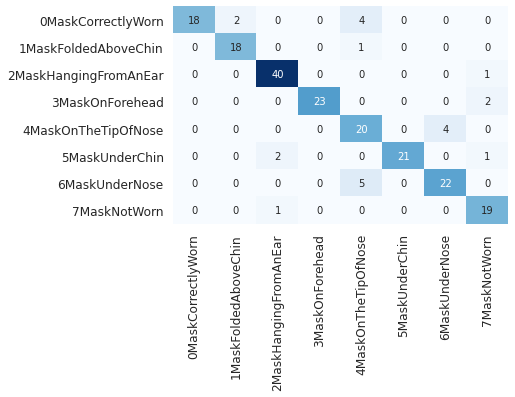

In [32]:
confusion_matrix = cm.ConfusionMeter(8)
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = effnet(inputs)
        _, predicted = torch.max(outputs, 1)
        confusion_matrix.add(predicted, labels)
    print(confusion_matrix.conf)


con_m = confusion_matrix.conf
df_con_m = pd.DataFrame(con_m, index= [i for i in class_names], columns = [i for i in class_names])
sn.set(font_scale= 1.1)
sn.heatmap(df_con_m, annot=True,fmt='g' ,  annot_kws={"size" : 10}, cbar = False, cmap="Blues") 

***

### Model 4: ResNet18

In [33]:
resnet = models.resnet18(pretrained=True)
num_ftrs = resnet.fc.in_features
resnet.fc = nn.Linear(num_ftrs, 8)
resnet = resnet.to(device)
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [34]:
summary(resnet, input_size=input_size )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 64, 128, 93]           9,408
       BatchNorm2d-2          [-1, 64, 128, 93]             128
              ReLU-3          [-1, 64, 128, 93]               0
         MaxPool2d-4           [-1, 64, 64, 47]               0
            Conv2d-5           [-1, 64, 64, 47]          36,864
       BatchNorm2d-6           [-1, 64, 64, 47]             128
              ReLU-7           [-1, 64, 64, 47]               0
            Conv2d-8           [-1, 64, 64, 47]          36,864
       BatchNorm2d-9           [-1, 64, 64, 47]             128
             ReLU-10           [-1, 64, 64, 47]               0
       BasicBlock-11           [-1, 64, 64, 47]               0
           Conv2d-12           [-1, 64, 64, 47]          36,864
      BatchNorm2d-13           [-1, 64, 64, 47]             128
             ReLU-14           [-1, 64,

In [35]:
criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.Adam(resnet.parameters(), lr = 0.001, betas=(0.9, 0.999))
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1) 

epoch_counter_train = []
epoch_counter_val = []
train_loss = []
val_loss = []
train_acc = []
val_acc = []

In [36]:
resnet = train_model(resnet, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=100) 

Epoch 1/100
----------


/extdrv/sdb/miniforge3/envs/pytorch-new/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:131: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


train Loss: 1.7890 Acc: 0.3530
val Loss: 3.6893 Acc: 0.3381

Epoch 2/100
----------
train Loss: 1.6213 Acc: 0.4121
val Loss: 1.7287 Acc: 0.4286

Epoch 3/100
----------
train Loss: 1.3471 Acc: 0.4852
val Loss: 1.0623 Acc: 0.5524

Epoch 4/100
----------
train Loss: 1.3173 Acc: 0.4977
val Loss: 1.4031 Acc: 0.5905

Epoch 5/100
----------
train Loss: 1.0921 Acc: 0.5723
val Loss: 1.6306 Acc: 0.5762

Epoch 6/100
----------
train Loss: 1.0866 Acc: 0.5879
val Loss: 1.0428 Acc: 0.6238

Epoch 7/100
----------
train Loss: 0.6965 Acc: 0.7154
val Loss: 0.6470 Acc: 0.7143

Epoch 8/100
----------
train Loss: 0.6166 Acc: 0.7589
val Loss: 0.6953 Acc: 0.6905

Epoch 9/100
----------
train Loss: 0.5381 Acc: 0.7885
val Loss: 0.5452 Acc: 0.7333

Epoch 10/100
----------
train Loss: 0.5073 Acc: 0.8087
val Loss: 0.5479 Acc: 0.7810

Epoch 11/100
----------
train Loss: 0.4862 Acc: 0.7932
val Loss: 0.6907 Acc: 0.7190

Epoch 12/100
----------
train Loss: 0.4531 Acc: 0.8336
val Loss: 0.5262 Acc: 0.7476

Epoch 13/100

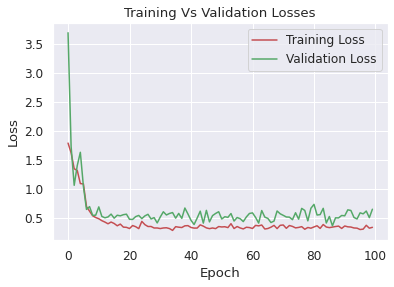

In [37]:
plt.figure(1)
plt.title("Training Vs Validation Losses")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.plot(epoch_counter_train,train_loss,color = 'r', label="Training Loss")
plt.plot(epoch_counter_val,val_loss,color = 'g', label="Validation Loss")
plt.legend()
plt.show()

In [38]:
print_size_of_model(resnet)

Size (MB): 44.800461


In [39]:
correct = 0
total = 0
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = resnet(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the test images: 79 %


In [40]:
class_correct = list(0. for i in range(8))
class_total = list(0. for i in range(8))
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = resnet(inputs)
            _, predicted = torch.max(outputs, 1)
            point = (predicted == labels).squeeze()
            for j in range(len(labels)):
                label = labels[j]
                class_correct[label] += point[j].item()
                class_total[label] += 1

for i in range(8):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))

Accuracy of 0MaskCorrectlyWorn : 58 %
Accuracy of 1MaskFoldedAboveChin : 78 %
Accuracy of 2MaskHangingFromAnEar : 70 %
Accuracy of 3MaskOnForehead : 92 %
Accuracy of 4MaskOnTheTipOfNose : 87 %
Accuracy of 5MaskUnderChin : 91 %
Accuracy of 6MaskUnderNose : 85 %
Accuracy of 7MaskNotWorn : 75 %


[[14  7  1  0  2  0  0  0]
 [ 4 15  0  0  0  0  0  0]
 [ 0  0 29  0  0  0  0 12]
 [ 0  0  1 23  0  0  0  1]
 [ 0  0  0  0 21  0  3  0]
 [ 0  0  1  0  0 22  0  1]
 [ 0  0  0  0  4  0 23  0]
 [ 0  0  4  1  0  0  0 15]]


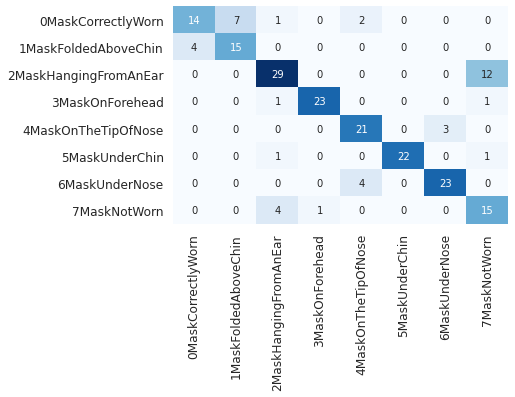

In [42]:
confusion_matrix = cm.ConfusionMeter(8)
with torch.no_grad():
    for i, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = resnet(inputs)
        _, predicted = torch.max(outputs, 1)
        confusion_matrix.add(predicted, labels)
    print(confusion_matrix.conf)

con_m = confusion_matrix.conf
df_con_m = pd.DataFrame(con_m, index= [i for i in class_names], columns = [i for i in class_names])
sn.set(font_scale= 1.1)
sn.heatmap(df_con_m, annot=True,fmt='g' ,  annot_kws={"size" : 10}, cbar = False, cmap="Blues") 

***

### Further Analysis - EfficientNet B3

Since EfficientNet B3 produced the best overall accuracy (88%), we will further analyze the correct and incorrect prediction generated by this model

In [54]:
preprocess = transforms.Compose([
                transforms.Resize((256, 185)),
                transforms.ToTensor(),
             ])
# Define a function to run EfficientNetB3 on any image
def run_effnet(image_name):
    img_v1 = Image.open(image_name).convert('RGB')
    img_v1_preprocessed = preprocess(img_v1)
    img_v1_preprocessed = img_v1_preprocessed.to(device)
    batch_img_v1_tensor = torch.unsqueeze(img_v1_preprocessed, 0)
    effnet.eval()
    
    with torch.no_grad():
        out = effnet(batch_img_v1_tensor)
        out_s = torch.sigmoid(out)
        y_score = out_s.squeeze(-1).cpu().detach().numpy()
        _, predicted = torch.max(out_s, 1)
        predicted_class = predicted.cpu().detach().numpy()[0]
    return predicted_class

In [58]:
import shutil, random
from PIL import Image
from sklearn import metrics

# Define the directory for each of the eight classes
correct_worn_path = './data_/test/0MaskCorrectlyWorn/'
correct_worn = [f for f in os.listdir(correct_worn_path) if f.endswith('.jpg')]
print(len(correct_worn))

folded_chin_path = './data_/test/1MaskFoldedAboveChin/'
folded_chin = [f for f in os.listdir(folded_chin_path) if f.endswith('.jpg')]
print(len(folded_chin))

hang_ear_path = './data_/test/2MaskHangingFromAnEar/'
hang_ear = [f for f in os.listdir(hang_ear_path) if f.endswith('.jpg')]
print(len(hang_ear))

on_forehead_path = './data_/test/3MaskOnForehead/'
on_forehead = [f for f in os.listdir(on_forehead_path) if f.endswith('.jpg')]
print(len(on_forehead))

tip_nose_path = './data_/test/4MaskOnTheTipOfNose/'
tip_nose = [f for f in os.listdir(tip_nose_path) if f.endswith('.jpg')]
print(len(tip_nose))

under_chin_path = './data_/test/5MaskUnderChin/'
under_chin = [f for f in os.listdir(under_chin_path) if f.endswith('.jpg')]
print(len(under_chin))

under_nose_path = './data_/test/6MaskUnderNose/'
under_nose = [f for f in os.listdir(under_nose_path) if f.endswith('.jpg')]
print(len(under_nose))

not_worn_path = './data_/test/7MaskNotWorn/'
not_worn = [f for f in os.listdir(not_worn_path) if f.endswith('.jpg')]
print(len(not_worn))

24
19
41
25
24
24
27
20


In [98]:
# Generate ground truth as arrays
true_0 = np.array([0] * len(correct_worn))
true_1 = np.array([1] * len(folded_chin))
true_2 = np.array([2] * len(hang_ear))
true_3 = np.array([3] * len(on_forehead))
true_4 = np.array([4] * len(tip_nose))
true_5 = np.array([5] * len(under_chin))
true_6 = np.array([6] * len(under_nose))
true_7 = np.array([7] * len(not_worn))

In [60]:
# Run EfficientNetB3 on each test images of the eight classes
result_0 = [run_effnet(correct_worn_path + img_name) for img_name in correct_worn]
result_1 = [run_effnet(folded_chin_path + img_name) for img_name in folded_chin]
result_2 = [run_effnet(hang_ear_path + img_name) for img_name in hang_ear]
result_3 = [run_effnet(on_forehead_path + img_name) for img_name in on_forehead]
result_4 = [run_effnet(tip_nose_path + img_name) for img_name in tip_nose]
result_5 = [run_effnet(under_chin_path + img_name) for img_name in under_chin]
result_6 = [run_effnet(under_nose_path + img_name) for img_name in under_nose]
result_7 = [run_effnet(not_worn_path + img_name) for img_name in not_worn]

In [61]:
# The prediction will be stored as arrays too
result_0 = np.array(result_0)
result_1 = np.array(result_1)
result_2 = np.array(result_2)
result_3 = np.array(result_3)
result_4 = np.array(result_4)
result_5 = np.array(result_5)
result_6 = np.array(result_6)
result_7 = np.array(result_7)

- Accuracy of 0MaskCorrectlyWorn : 75 %
- Accuracy of 1MaskFoldedAboveChin : 94 %
- Accuracy of 2MaskHangingFromAnEar : 97 %
- Accuracy of 3MaskOnForehead : 92 %
- Accuracy of 4MaskOnTheTipOfNose : 83 %
- Accuracy of 5MaskUnderChin : 87 %
- Accuracy of 6MaskUnderNose : 81 %
- Accuracy of 7MaskNotWorn : 95 %

From the results generated by EfficientNetB3 as shown above, "0MaskCorrectlyWorn" and "6MaskUnderNose" have lower accuracies compared to other classes. Let's examine the incorrect prediction for each of these classes.

[ 0  1  9 11 12 20]
0004_MRCW_DRNV_0090.jpg


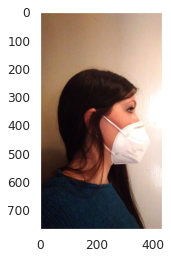

0004_MRCW_SRGM_0090.jpg


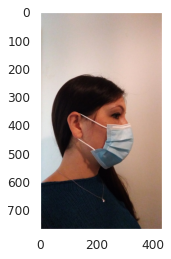

0022_MRCW_SRGM_0000.jpg


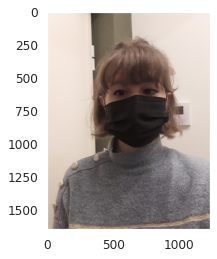

0024_MRCW_NMDM_0090.jpg


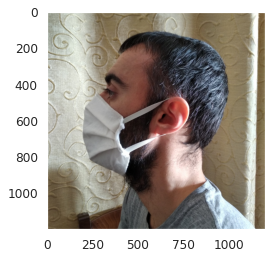

0026_MRCW_SRGM_0045.jpg


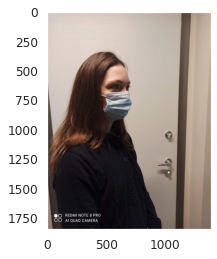

0040_MRCW_NMDM_0090.jpg


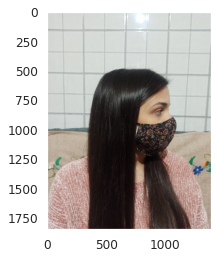

In [99]:
# Visualize the incorrectly predicted "0MaskCorrectlyWorn" images
wrong_0 = np.where(true_0!=result_0)[0]
print(wrong_0)
for i in wrong_0:
    print(correct_worn[i])
    srcpath = os.path.join(correct_worn_path, correct_worn[i])
    img = cv2.imread(srcpath)
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_)
    plt.grid(None)
    plt.show()

In [104]:
# print the incorrect prediction results for "0MaskCorrectlyWorn"
for i in wrong_0:
    print(result_0[i])

4
4
1
4
1
4


As shown above, the model incorrectly predicted four images as '4MaskOnTheTipOfNose' and two images as '1MaskFoldedAboveChin'

[ 1  2 13 21 22]
0001_MRNN_DRWV_0000.jpg


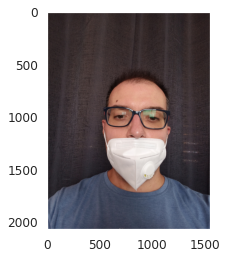

0002_MRNN_NMDM_0000.jpg


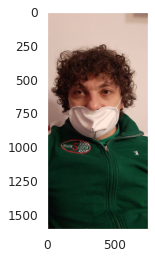

0012_MRNN_NMDM_0045.jpg


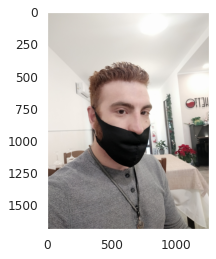

0033_MRNN_SRGM_0045.jpg


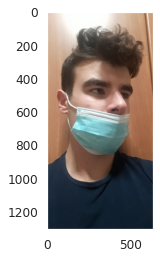

0038_MRNN_SRGM_0045.jpg


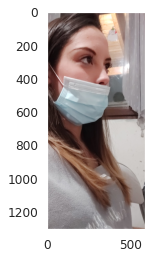

In [102]:
# visualize the incorrectly predicted "6MaskUnderNose" images
wrong_6 = np.where(true_6!=result_6)[0]
print(wrong_6)
for i in wrong_6:
    print(under_nose[i])
    srcpath = os.path.join(under_nose_path, under_nose[i])
    img = cv2.imread(srcpath)
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_)
    plt.grid(None)
    plt.show()

In [103]:
# print the incorrect prediction results for "6MaskUnderNose"
for i in wrong_6:
    print(result_6[i])

4
4
4
4
4


Similarly, the model incorrectly predicted the images as '4MaskOnTheTipOfNose' 

### Gradient-weighted Class Activation Mapping (Grad-CAM)

Therefore, we are interested to know why the model incorrectly predicted these images as '4MaskOnTheTipOfNose'. For "0MaskCorrectlyWorn", we will use Grad-CAM to visualize the regions of the images that led to the incorrect prediction (the model classified the images as '4MaskOnTheTipOfNose' based on these regions).

In [81]:
# Use GradCam to understand how the model makes prediction
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad,GuidedBackpropReLUModel
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget,BinaryClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image,deprocess_image

# Get the target layer which is the final layer of the model
target_layers = [effnet.features[8][0]]
print(target_layers)

# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=effnet, target_layers=target_layers, use_cuda=False)
gb_model = GuidedBackpropReLUModel(model=effnet, use_cuda=False)

[Conv2d(384, 1536, kernel_size=(1, 1), stride=(1, 1), bias=False)]


In [118]:
def tensor2arr(img_tensor):
    img_tensor = (img_tensor[0,...].cpu().detach().permute(1,2,0).numpy()*255).astype(np.uint8)
    return img_tensor

def predModel(x):
    with torch.no_grad():
        pred = effnet(x)
    return pred

# Why predict as '4MaskOnTheTipOfNose'
def viewGradCam4(srcpath):
    img_v1 = Image.open(srcpath).convert('RGB')
    img_v1_preprocessed = preprocess(img_v1)
    img_v1_preprocessed = img_v1_preprocessed.to(device)
    batch_img_v1_tensor = torch.unsqueeze(img_v1_preprocessed, 0)
    pred = predModel(batch_img_v1_tensor)
    input_tensor = batch_img_v1_tensor
    targets = [ClassifierOutputTarget(4)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = tensor2arr(input_tensor)/255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    gb = gb_model(input_tensor, target_category=None)
    cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam])
    cam_gb = deprocess_image(cam_mask * gb)
    gb = deprocess_image(gb)
    plt.figure(1, figsize=(10,8))
    plt.subplot(131)
    plt.imshow(visualization)
    plt.grid(None)
    plt.subplot(132)
    plt.imshow(gb)
    plt.grid(None)
    plt.subplot(133)
    plt.imshow(cam_gb)
    plt.grid(None)
    plt.show()


In [113]:
# Get the id of the "0MaskCorrectlyWorn" images incorrectly predicted as '4MaskOnTheTipOfNose'
predict_wrong_0 = []
for i in wrong_0:
    if result_0[i] == 4:
        predict_wrong_0.append(i)

print(predict_wrong_0)

[0, 1, 11, 20]


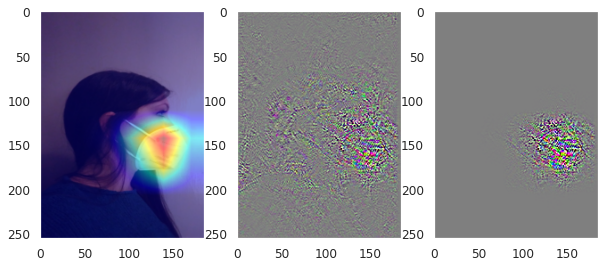

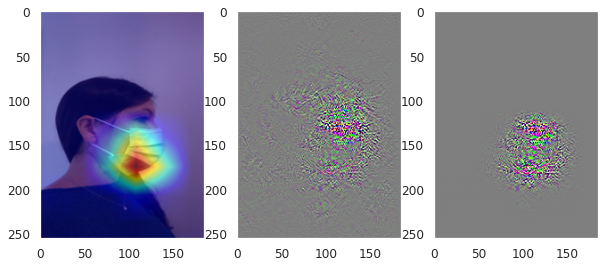

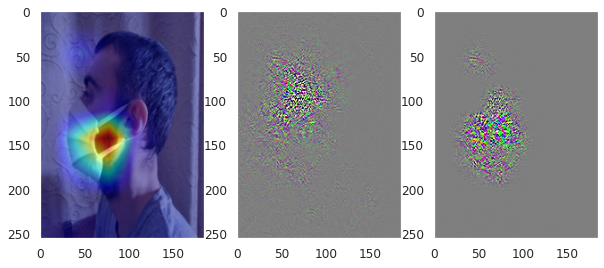

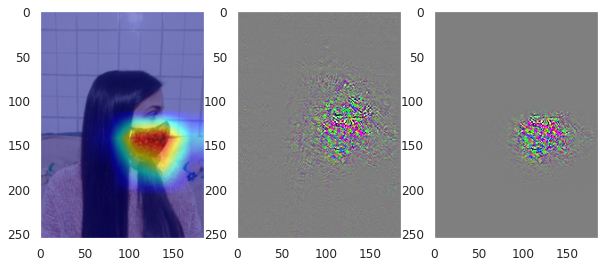

In [119]:
for i in predict_wrong_0:
    viewGradCam4(correct_worn_path + correct_worn[i]) 

From the visualization, it is certain that the model failed to recognize the actual distinguishing features of '4MaskOnTheTipOfNose'. In fact, the model focused on random areas such as the mask and the cheek instead of "the tip of the nose". Ideally, to classify the image as '4MaskOnTheTipOfNose', the model should identify the regions where  "the tip of the nose" is visible. The model's performance could be improved by increasing the training dataset, particularly for '2MaskHangingFromAnEar' and '6MaskUnderNose' as these two classes look very similar to '0MaskCorrectlyWorn'.

We would also like to visualize and examine the correct prediction made for "2MaskHangingFromAnEar", which is the class with the highest accuracy (97%) achieved by EfficientNet B3.

In [120]:
# Why predict as 2MaskHangingFromAnEar'
def viewGradCam2(srcpath):
    img_v1 = Image.open(srcpath).convert('RGB')
    img_v1_preprocessed = preprocess(img_v1)
    img_v1_preprocessed = img_v1_preprocessed.to(device)
    batch_img_v1_tensor = torch.unsqueeze(img_v1_preprocessed, 0)
    pred = predModel(batch_img_v1_tensor)
    input_tensor = batch_img_v1_tensor
    targets = [ClassifierOutputTarget(2)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = tensor2arr(input_tensor)/255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    gb = gb_model(input_tensor, target_category=None)
    cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam])
    cam_gb = deprocess_image(cam_mask * gb)
    gb = deprocess_image(gb)
    plt.figure(1, figsize=(10,8))
    plt.subplot(131)
    plt.imshow(visualization)
    plt.grid(None)
    plt.subplot(132)
    plt.imshow(gb)
    plt.grid(None)
    plt.subplot(133)
    plt.imshow(cam_gb)
    plt.grid(None)
    plt.show()


[ 0  1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
0016_MRHN_NMDM_0045_F.jpg


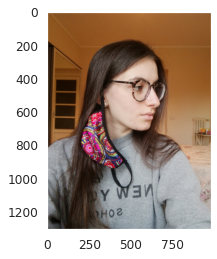

0001_MRHN_DRNV_0045_B.jpg


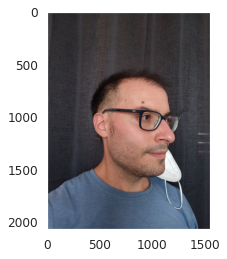

0001_MRHN_NMDM_0090_B.jpg


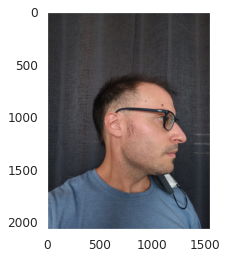

0002_MRHN_SRGM_0045_B.jpg


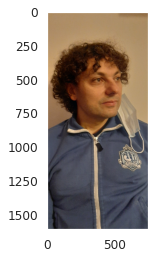

0002_MRHN_SRGM_0045_F.jpg


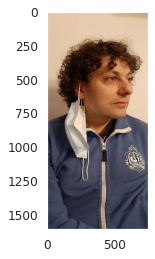

0003_MRHN_SRGM_0045_F.jpg


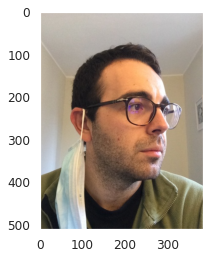

0003_MRHN_SRGM_0090_B.jpg


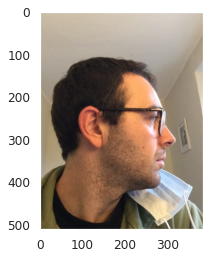

0004_MRHN_DRNV_0090_B.jpg


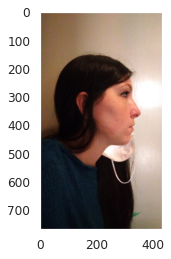

0004_MRHN_SRGM_0045_F.jpg


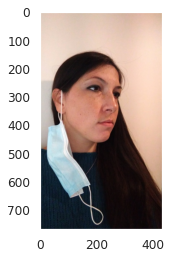

0005_MRHN_NMDM_0000.jpg


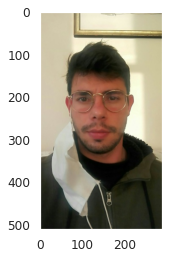

In [123]:
# Visualize the correctly predicted "2MaskHangingFromAnEar" images, limited to 10 images
correct_2 = np.where(true_2==result_2)[0]
print(correct_2)
for i in correct_2[:10]:
    print(hang_ear[i])
    srcpath = os.path.join(hang_ear_path, hang_ear[i])
    img = cv2.imread(srcpath)
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_)
    plt.grid(None)
    plt.show()

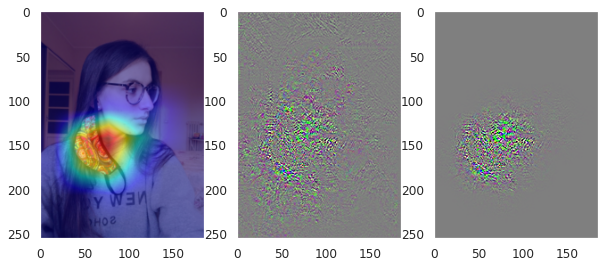

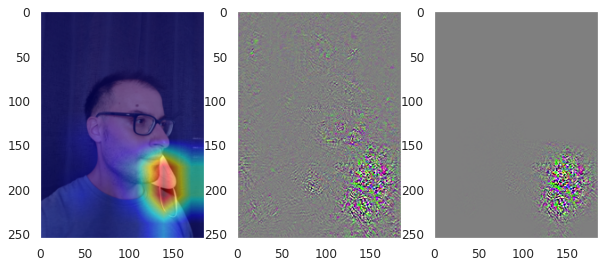

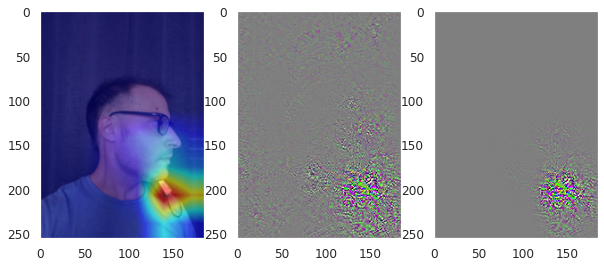

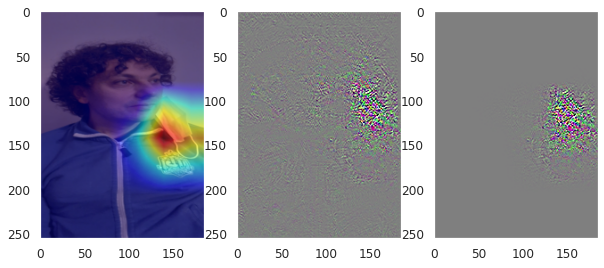

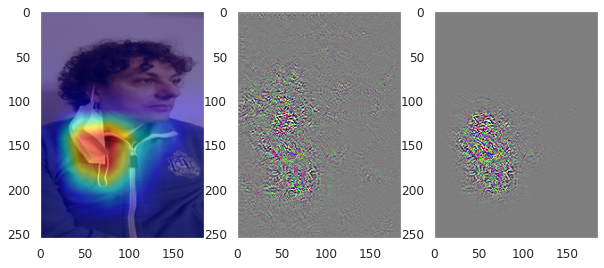

...

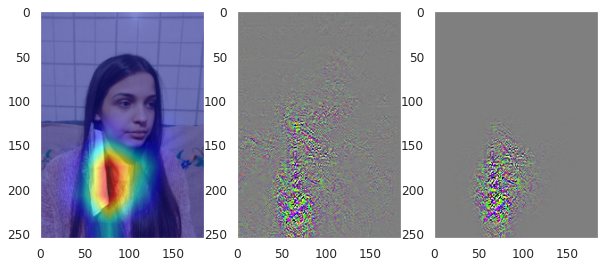

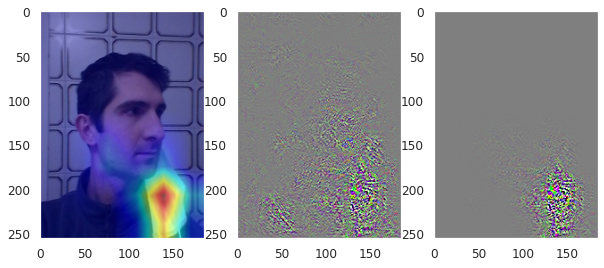

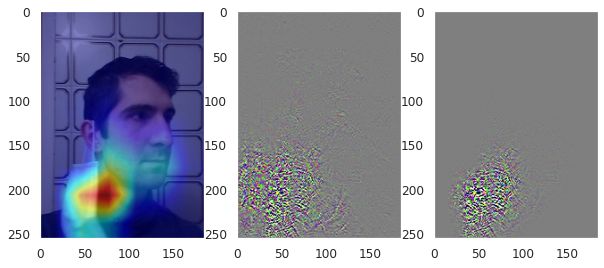

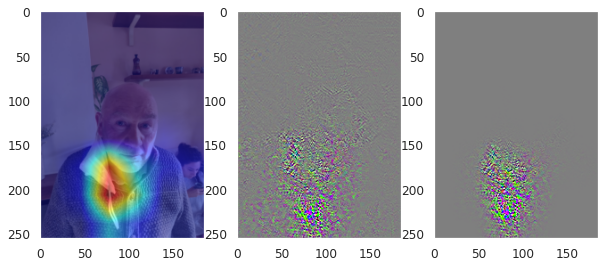

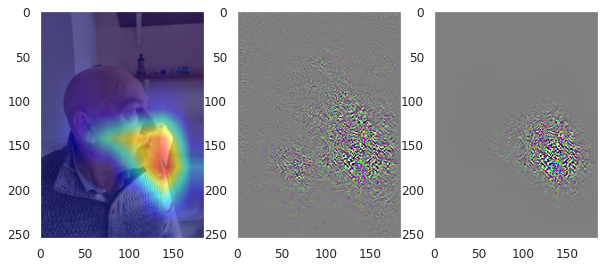

In [124]:
for i in correct_2:
    viewGradCam2(hang_ear_path + hang_ear[i]) 

As shown above, the model made the correct prediction by focusing on the hanging mask, which is exactly what we wanted.